## Smoothing and enhancing spatial features using Smoother-guided imputation (Fig S6)

In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from scipy.io import mmread

from smoother import SpatialWeightMatrix, SpatialLoss
from smoother.models.impute import ImputeTorch, ImputeConvex

In [4]:
data_dir = "/Users/jysumac/Projects/Smoother_paper/data/mbm_slideseqv2/"

## MBM11

### Load data

In [5]:
sample_id = "MBM11_rep2"

# read in functional scores, num_spot x num_features
ft_scores = mmread(f"{data_dir}/{sample_id}/selected_features_seurat_scores.mtx").toarray()
feature_names = pd.read_table(f"{data_dir}/{sample_id}/selected_features.txt", header = None)
feature_names = feature_names[0].str[:-1].str.replace('Antigenpresentation_class_', 'MHC-')
feature_names = feature_names.str.replace('_', ' ').to_numpy()

# spatial coordinates, num_spot x 2
coords = pd.read_csv(f"{data_dir}/{sample_id}/coords.csv", index_col = 0)

assert ft_scores.shape[0] == coords.shape[0]
assert ft_scores.shape[1] == feature_names.shape[0]

print(f"Number of spots: {ft_scores.shape[0]}")
print(f"Number of genes: {ft_scores.shape[1]}")

y = torch.tensor(ft_scores).float() # num_spot x num_gene

Number of spots: 39049
Number of genes: 19


### Generate spatial loss

By default spatial weight matrix is symmetric (a requirement for the CAR and ICAR models).

In [6]:
# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords, k=4)

# convert spatial weight into loss
spatial_loss = SpatialLoss('icar', weights, rho=0.9, standardize_cov=False)

Number of spots: 39049. Average number of neighbors per spot:  3.36.


### Spatial feature smoothing

In [13]:
# m = ImputeTorch(y, spatial_loss, fixed_obs = False, nonneg=False, lambda_spatial_loss = 1,
#                 verbose = False, lr = 1e-1, max_epochs = -1, tol = 1e-8)
spatial_loss.standardize_cov = True
m = ImputeConvex(y, spatial_loss, fixed_obs = False, nonneg=False, lambda_spatial_loss = 1)
y_imp = torch.tensor(m.get_results())

=== Time  7.57s. Loss: (total)  0.035, (recon)  0.019, (spatial)  0.015


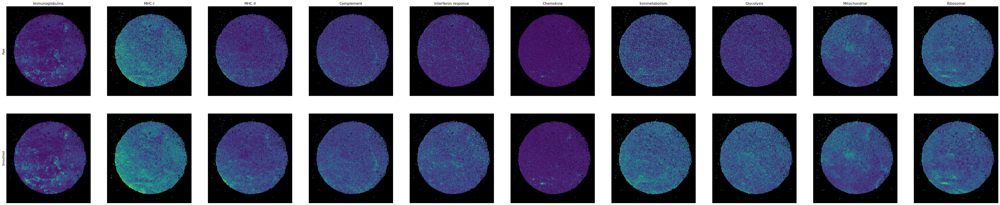

In [14]:
ft_to_plot = ['Immunoglobulins', 'MHC-I', 'MHC-II', 'Complement', 'Interferon response', 'Chemokine',
              'Ironmetabolism', 'Glycolysis', 'Mitochondrial', 'Ribosomal']
ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
n_ft = len(ft_to_plot)


fig, axs = plt.subplots(ncols = n_ft, nrows = 2, figsize = [6 * n_ft, 6 * 2])
for i, ax_col in enumerate(axs.T):
    ax_col[0].scatter(coords['x'], coords['y'],
                      c = y[:, ft_idx[i]], s = 1)
    ax_col[1].scatter(coords['x'], coords['y'],
                      c = y_imp[:, ft_idx[i]], s = 1)
    ax_col[0].set_title(feature_names[ft_idx[i]])
    
    if i == 0:
        ax_col[0].set_ylabel('Raw')
        ax_col[1].set_ylabel('Smoothed')

for ax in axs.flatten():
    ax.set_facecolor('black')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

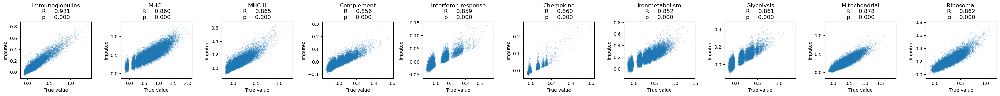

In [15]:
ft_to_plot = ['Immunoglobulins', 'MHC-I', 'MHC-II', 'Complement', 'Interferon response', 'Chemokine',
              'Ironmetabolism', 'Glycolysis', 'Mitochondrial', 'Ribosomal']
ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
n_ft = len(ft_to_plot)

fig, axs = plt.subplots(ncols = n_ft, nrows = 1, figsize = [3 * n_ft, 3 * 1])
for i, ax in enumerate(axs):
    ax.scatter(y[:, ft_idx[i]], y_imp[:, ft_idx[i]], s = 1, alpha = 0.2)
    ax.set_title(
        f"{feature_names[ft_idx[i]]}\n" + 
        f"R = {sp.stats.pearsonr(y[:, ft_idx[i]].T, y_imp[:, ft_idx[i]].T)[0]:.3f}\n" +
        f"p = {sp.stats.pearsonr(y[:, ft_idx[i]].T, y_imp[:, ft_idx[i]].T)[1]:.3f}"
    )
    
    ax.set_ylabel('Imputed')
    ax.set_xlabel('True value')

plt.tight_layout()
plt.show()

### Feature correlation / colocalization

In [16]:
def sig_test(p_val):
    """Convert p-value to asterick."""
    if p_val > 0.05:
        return ''
    elif p_val > 0.01:
        return '*'
    elif p_val >= 0:
        return '**'
    raise ValueError

def pearsonr_col(data):
    """Calculate Pearson R and p-value among columns."""
    nrow, ncol = data.shape[0], data.shape[1]
    r = np.ones((ncol, ncol)) # pearson r
    p = np.ones((ncol, ncol)) # p-value
    
    for i in range(ncol):
        for j in range(i+1, ncol):
            r_, p_ = sp.stats.pearsonr(data[:,i], data[:,j])
            r[i, j] = r[j, i] = r_
            p[i, j] = p[j, i] = p_
 
    return r, p

def combine_corr_obs_imp(y_obs, y_imp, ft_to_plot, sig_mark = False):
    """Combine observed and imputed corrcoef matrices for visualization."""
    n_ft = len(ft_to_plot)
    ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
    
    # calculate pearson r and p-value
    r_obs, p_obs = pearsonr_col(y_obs[:,ft_idx])
    r_imp, p_imp = pearsonr_col(y_imp[:,ft_idx])
    
    # down triangle: observed corrcoef
    # up triangle: imputed corrcoef
    mask_down = np.ones((n_ft, n_ft))
    mask_down[np.triu_indices_from(mask_down)] = False
    mask_up = np.zeros((n_ft, n_ft))
    mask_up[np.triu_indices_from(mask_up)] = True

    corr_combined = r_obs * mask_down + r_imp * mask_up
    
    if not sig_mark:
        return corr_combined
    
    # convert p-value to asterick marks
    ast_obs = np.vectorize(sig_test)(p_obs)
    ast_imp = np.vectorize(sig_test)(p_imp)
    
    ast_combined = np.chararray((n_ft, n_ft), unicode=True)
    ast_combined[np.where(mask_down)] = ast_obs[np.where(mask_down)]
    ast_combined[np.where(mask_up)] = ast_imp[np.where(mask_up)]
    
    return corr_combined, ast_combined

In [17]:
corr_mat_obs = torch.corrcoef(y.T)
corr_mat_imp = torch.corrcoef(y_imp.T)

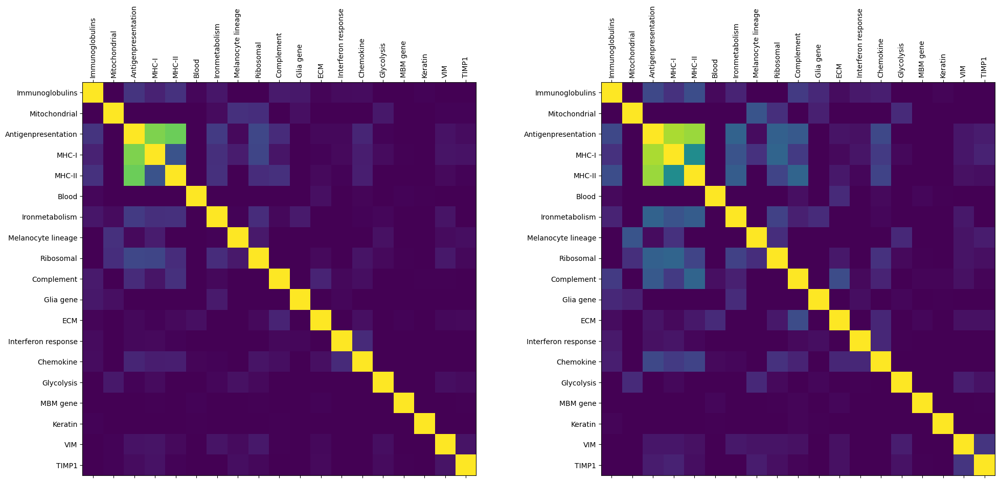

In [18]:
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = [12 * 2, 10 * 1])
axs[0].matshow(corr_mat_obs, vmax = 1, vmin = 0)
axs[1].matshow(corr_mat_imp, vmax = 1, vmin = 0)

for ax in axs:
    ax.set_yticks(ticks = np.arange(0, len(feature_names)),
                  labels = feature_names)
    ax.set_xticks(ticks = np.arange(0, len(feature_names)),
                  labels = feature_names, rotation = 90)
plt.show()

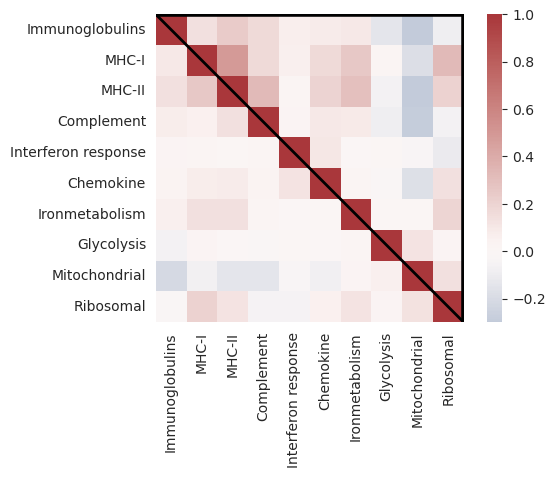

In [19]:
ft_to_plot = ['Immunoglobulins', 'MHC-I', 'MHC-II', 'Complement', 'Interferon response', 'Chemokine',
              'Ironmetabolism', 'Glycolysis', 'Mitochondrial', 'Ribosomal']
n_ft = len(ft_to_plot)

corr_combined, ast_combined = combine_corr_obs_imp(y, y_imp, ft_to_plot, sig_mark = True)

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize = [6, 4])
    sns.heatmap(corr_combined, vmin=-0.3, vmax=1, center = 0,
                #annot=ast_combined, fmt='',
                square=True, ax=ax, cmap = 'vlag')

ax.set_yticks(ticks = np.arange(0, n_ft) + 0.5,
              labels=ft_to_plot,
              rotation = 0)
ax.set_xticks(ticks = np.arange(0, n_ft) + 0.5,
              labels=ft_to_plot,
              rotation = 90)
ax.plot([1, 0], [0, 1], transform=ax.transAxes, c = 'black', linewidth = 2)
ax.plot([1, 1], [0, 1], transform=ax.transAxes, c = 'black', linewidth = 4)
ax.plot([1, 0], [1, 1], transform=ax.transAxes, c = 'black', linewidth = 4)

plt.show()

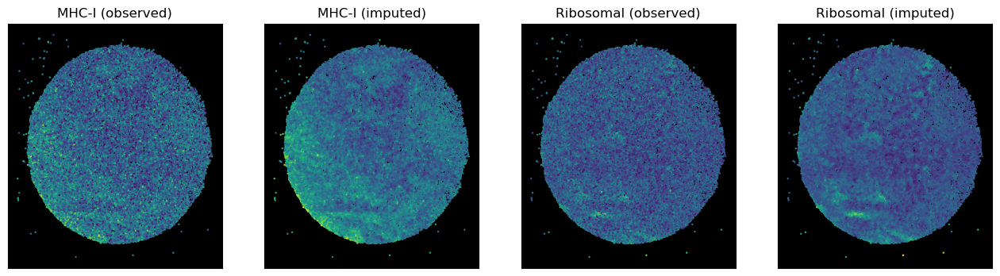

In [20]:
ft_to_plot = ['MHC-I', 'Ribosomal']
ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
n_ft = len(ft_to_plot)


fig, axs = plt.subplots(ncols = n_ft * 2, nrows = 1, figsize = [4 * n_ft * 2, 4])
for i in range(n_ft):
    axs[2*i].scatter(coords['x'], coords['y'],
                    c = y[:, ft_idx[i]], s = 0.5)
    axs[2*i + 1].scatter(coords['x'], coords['y'],
                    c = y_imp[:, ft_idx[i]], s = 0.5)
    axs[2*i].set_title(feature_names[ft_idx[i]] + ' (observed)')
    axs[2*i + 1].set_title(feature_names[ft_idx[i]] + ' (imputed)')

for ax in axs.flatten():
    ax.set_facecolor('black')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## ECM01

### Load data

In [21]:
sample_id = "ECM01_rep2"

# read in functional scores, num_spot x num_features
ft_scores = mmread(f"{data_dir}/{sample_id}/selected_features_seurat_scores.mtx").toarray()
feature_names = pd.read_table(f"{data_dir}/{sample_id}/selected_features.txt", header = None)
feature_names = feature_names[0].str[:-1].str.replace('Antigenpresentation_class_', 'MHC-')
feature_names = feature_names.str.replace('_', ' ').to_numpy()

# spatial coordinates, num_spot x 2
coords = pd.read_csv(f"{data_dir}/{sample_id}/coords.csv", index_col = 0)

assert ft_scores.shape[0] == coords.shape[0]
assert ft_scores.shape[1] == feature_names.shape[0]

print(f"Number of spots: {ft_scores.shape[0]}")
print(f"Number of genes: {ft_scores.shape[1]}")

y = torch.tensor(ft_scores).float() # num_spot x num_gene

Number of spots: 24150
Number of genes: 19


In [22]:
from itertools import product
n_grid = 100
x_min, x_max = coords.x.quantile(0.01), coords.x.quantile(0.99)
y_min, y_max = coords.y.quantile(0.01), coords.y.quantile(0.99)

new_coords = pd.DataFrame(list(product(
    np.arange(x_min, x_max, (x_max - x_min) / n_grid),
    np.arange(y_min, y_max, (y_max - y_min) / n_grid)
)))
new_coords.columns = ['x', 'y']
new_coords = pd.concat([coords, new_coords])

print(f"Number of spots: {new_coords.shape[0]}")

Number of spots: 34150


### Generate spatial loss

By default spatial weight matrix is symmetric (a requirement for the CAR and ICAR models).

In [23]:
# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(new_coords, k=4)

# convert spatial weight into loss
spatial_loss = SpatialLoss('icar', weights, rho=0.9, standardize_cov=False)

Number of spots: 34150. Average number of neighbors per spot:  3.30.


### Spatial feature smoothing and imputation

In [24]:
# m = ImputeTorch(y, spatial_loss, fixed_obs = False, nonneg=False, lambda_spatial_loss = 1,
#                 verbose = False, lr = 1e-1, max_epochs = -1, tol = 1e-8)
# y_imp = m.get_results()
spatial_loss.standardize_cov = True
m = ImputeConvex(y, spatial_loss, fixed_obs = False, nonneg=False, lambda_spatial_loss = 1)
y_imp = torch.tensor(m.get_results())

=== Time  5.48s. Loss: (total)  0.064, (recon)  0.032, (spatial)  0.032


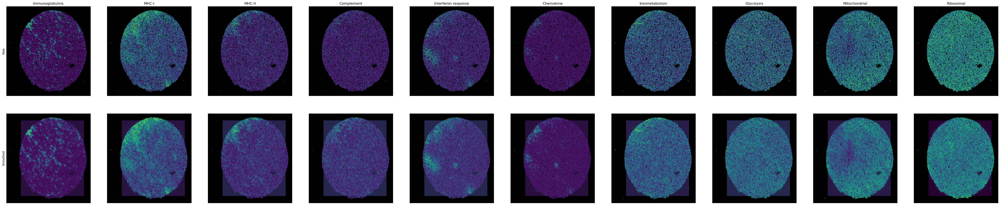

In [25]:
ft_to_plot = ['Immunoglobulins', 'MHC-I', 'MHC-II', 'Complement', 'Interferon response', 'Chemokine',
              'Ironmetabolism', 'Glycolysis', 'Mitochondrial', 'Ribosomal']
ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
n_ft = len(ft_to_plot)


fig, axs = plt.subplots(ncols = n_ft, nrows = 2, figsize = [6 * n_ft, 6 * 2])
for i, ax_col in enumerate(axs.T):
    ax_col[0].scatter(coords['x'], coords['y'],
                      c = y[:, ft_idx[i]], s = 1)
    ax_col[1].scatter(new_coords['x'], new_coords['y'],
                      c = y_imp[:, ft_idx[i]], s = 1)
    ax_col[0].set_title(feature_names[ft_idx[i]])
    
    if i == 0:
        ax_col[0].set_ylabel('Raw')
        ax_col[1].set_ylabel('Smoothed')

for ax in axs.flatten():
    ax.set_facecolor('black')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

### Feature correlation / colocalization

In [26]:
corr_mat_obs = torch.corrcoef(y.T)
corr_mat_imp = torch.corrcoef(y_imp.T)

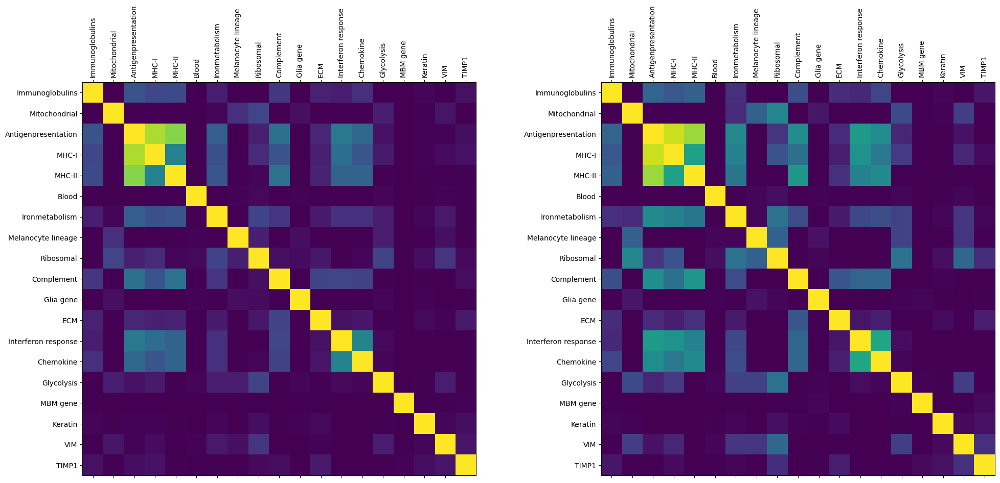

In [27]:
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = [12 * 2, 10 * 1])
axs[0].matshow(corr_mat_obs, vmax = 1, vmin = 0)
axs[1].matshow(corr_mat_imp, vmax = 1, vmin = 0)

for ax in axs:
    ax.set_yticks(ticks = np.arange(0, len(feature_names)),
                  labels = feature_names)
    ax.set_xticks(ticks = np.arange(0, len(feature_names)),
                  labels = feature_names, rotation = 90)
plt.show()

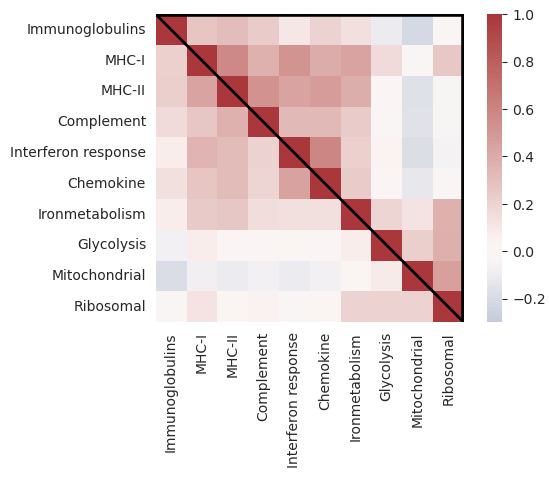

In [28]:
ft_to_plot = ['Immunoglobulins', 'MHC-I', 'MHC-II', 'Complement', 'Interferon response', 'Chemokine',
              'Ironmetabolism', 'Glycolysis', 'Mitochondrial', 'Ribosomal']
n_ft = len(ft_to_plot)

corr_combined, ast_combined = combine_corr_obs_imp(y, y_imp, ft_to_plot, sig_mark = True)

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize = [6, 4])
    sns.heatmap(corr_combined, vmin=-0.3, vmax=1, center = 0,
                #annot=ast_combined, fmt='',
                square=True, ax=ax, cmap = 'vlag')

ax.set_yticks(ticks = np.arange(0, n_ft) + 0.5,
              labels=ft_to_plot,
              rotation = 0)
ax.set_xticks(ticks = np.arange(0, n_ft) + 0.5,
              labels=ft_to_plot,
              rotation = 90)
ax.plot([1, 0], [0, 1], transform=ax.transAxes, c = 'black', linewidth = 2)
ax.plot([1, 1], [0, 1], transform=ax.transAxes, c = 'black', linewidth = 4)
ax.plot([1, 0], [1, 1], transform=ax.transAxes, c = 'black', linewidth = 4)

plt.show()

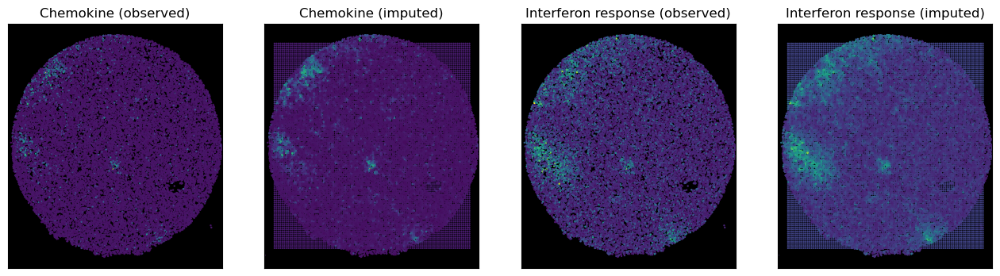

In [29]:
ft_to_plot = ['Chemokine', 'Interferon response']
ft_idx = [np.where(feature_names == ft)[0][0] for ft in ft_to_plot]
n_ft = len(ft_to_plot)


fig, axs = plt.subplots(ncols = n_ft * 2, nrows = 1, figsize = [4 * n_ft * 2, 4])
for i in range(n_ft):
    axs[2*i].scatter(coords['x'], coords['y'],
                    c = y[:, ft_idx[i]], s = 0.5)
    axs[2*i + 1].scatter(new_coords['x'], new_coords['y'],
                    c = y_imp[:, ft_idx[i]], s = 0.5)
    axs[2*i].set_title(feature_names[ft_idx[i]] + ' (observed)')
    axs[2*i + 1].set_title(feature_names[ft_idx[i]] + ' (imputed)')

for ax in axs.flatten():
    ax.set_facecolor('black')
    ax.set_xlim(new_coords.x.quantile(3e-5), new_coords.x.max())
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()